# Data Scientist Professional Case Study

### Company Background

Inn the Neighborhood is an online platform that allows people to rent out their properties for short stays. At the moment, only 2% of people who come to the site interested in renting out their homes start to use it.

The product manager would like to increase this. They want to develop an application to help people estimate how much they could earn renting out their living space. They hope that this would make people more likely to sign up.



### Customer Question

The product manager would like to know:
- Can you develop a way to predict how much someone could earn from renting their property that could power the application?




### Success Criteria

They want to avoid estimating prices that are more than 25 dollars off of the actual price, as this may discourage people.


### Dataset

The data you will use for this analysis can be accessed here: `"data/rentals.csv"`

In [1]:
!python -m pip install numpy
!python -m pip install pandas
!python -m pip install matplotlib
!python -m pip install seaborn
!python -m pip install scipy
!python -m pip install scikit-learn
!python -m pip install icecream
!python -m pip install missingno
!python -m pip install plotly-express
!python -m pip install h3
!python -m pip install h3pandas
!python -m pip install lightgbm
!python -m pip install hgboost

  Obtaining dependency information for numpy from https://files.pythonhosted.org/packages/d5/50/8aedb5ff1460e7c8527af15c6326115009e7c270ec705487155b779ebabb/numpy-1.25.2-cp310-cp310-macosx_10_9_x86_64.whl.metadata
  Using cached numpy-1.25.2-cp310-cp310-macosx_10_9_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.25.2-cp310-cp310-macosx_10_9_x86_64.whl (20.8 MB)
  Obtaining dependency information for pandas from https://files.pythonhosted.org/packages/cf/ba/be69b6fa37c74699d333dbcbf0fc799eb31c35ce465651cdc4baf6a2e30d/pandas-2.1.0-cp310-cp310-macosx_10_9_x86_64.whl.metadata
  Using cached pandas-2.1.0-cp310-cp310-macosx_10_9_x86_64.whl.metadata (18 kB)
  Obtaining dependency information for pytz>=2020.1 from https://files.pythonhosted.org/packages/32/4d/aaf7eff5deb402fd9a24a1449a8119f00d74ae9c2efa79f8ef9994261fc2/pytz-2023.3.post1-py2.py3-none-any.whl.metadata
  Using cached pytz-2023.3.post1-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2023.3-py2.py3-none-any.whl (341 k

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from icecream import ic

#missing data
import missingno as msno

# data visualization
import plotly.express as px

import h3pandas
import geopandas as gpd

# sklearn imports
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error as mse, max_error, median_absolute_error
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import make_pipeline

import lightgbm as lgb
from lightgbm import LGBMRegressor

from hgboost import hgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 94.3 MB/s eta 0:00:00
--- Logging error ---
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/rich/console.py", line 1673, in print
    extend(render(renderable, render_options))
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/rich/console.py", line 1305, in render
    for render_output in iter_render:
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/rich/segment.py", line 249, in split_lines
    for segment in segments:
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/rich/console.py", line 1283, in render
    renderable = rich_cast(renderable)
  File

## 1. Import

In [2]:
rentals = pd.read_csv('data/rentals.csv')
print(rentals.info())
print(rentals.describe())
print(rentals.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8111 entries, 0 to 8110
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              8111 non-null   int64  
 1   latitude        8111 non-null   float64
 2   longitude       8111 non-null   float64
 3   property_type   8111 non-null   object 
 4   room_type       8111 non-null   object 
 5   bathrooms       8099 non-null   float64
 6   bedrooms        8107 non-null   float64
 7   minimum_nights  8111 non-null   int64  
 8   price           8111 non-null   object 
dtypes: float64(4), int64(2), object(3)
memory usage: 570.4+ KB
None
                 id     latitude    longitude    bathrooms     bedrooms  \
count  8.111000e+03  8111.000000  8111.000000  8099.000000  8107.000000   
mean   2.024561e+07    37.766054  -122.430107     1.395975     1.345874   
std    1.228565e+07     0.022937     0.026967     0.923213     0.925298   
min    9.580000e+02    37.7046

## 2. Initial Exploration

### Price Datatype

With the price having an 'object' data type, it makes further analysis difficult. Converting the price column to a numeric value will allow for further analysis and modeling.

In [3]:
#remove '$' ',' and whitespaces from strings to allow for conversion to numeric type
rentals['price'] = rentals['price'].str.replace("$","").str.replace(",","").str.strip()

#convert to integer type
rentals['price'] = rentals['price'].astype('float').astype('int')

In [4]:
rentals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8111 entries, 0 to 8110
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              8111 non-null   int64  
 1   latitude        8111 non-null   float64
 2   longitude       8111 non-null   float64
 3   property_type   8111 non-null   object 
 4   room_type       8111 non-null   object 
 5   bathrooms       8099 non-null   float64
 6   bedrooms        8107 non-null   float64
 7   minimum_nights  8111 non-null   int64  
 8   price           8111 non-null   int64  
dtypes: float64(4), int64(3), object(2)
memory usage: 570.4+ KB


In [5]:
rentals.head()

,id,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price
0,958,37.76931,-122.43386,Apartment,Entire home/apt,1.0,1.0,1,170
1,3850,37.75402,-122.45805,House,Private room,1.0,1.0,1,99
2,5858,37.74511,-122.42102,Apartment,Entire home/apt,1.0,2.0,30,235
3,7918,37.76669,-122.45250,Apartment,Private room,4.0,1.0,32,65
4,8142,37.76487,-122.45183,Apartment,Private room,4.0,1.0,32,65


### ID Column Cleanup

Dropping the ID column is fine since it doesn't give any relevant information.

In [6]:
rentals.drop('id', axis=1, inplace=True)

In [7]:
rentals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8111 entries, 0 to 8110
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   latitude        8111 non-null   float64
 1   longitude       8111 non-null   float64
 2   property_type   8111 non-null   object 
 3   room_type       8111 non-null   object 
 4   bathrooms       8099 non-null   float64
 5   bedrooms        8107 non-null   float64
 6   minimum_nights  8111 non-null   int64  
 7   price           8111 non-null   int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 507.1+ KB


### Price Distribution

<AxesSubplot:xlabel='price'>

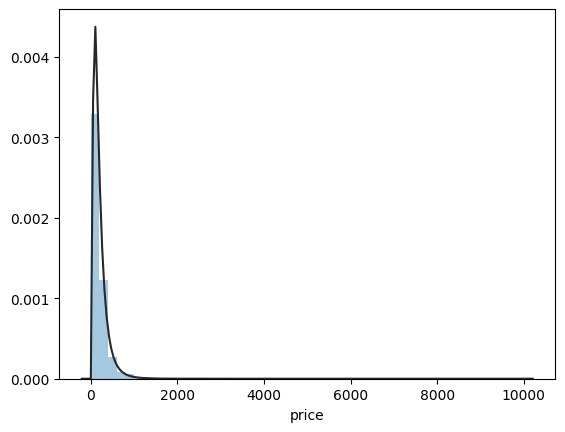

In [8]:
sns.distplot(rentals['price'], kde=False, fit=stats.lognorm)

<AxesSubplot:xlabel='price'>

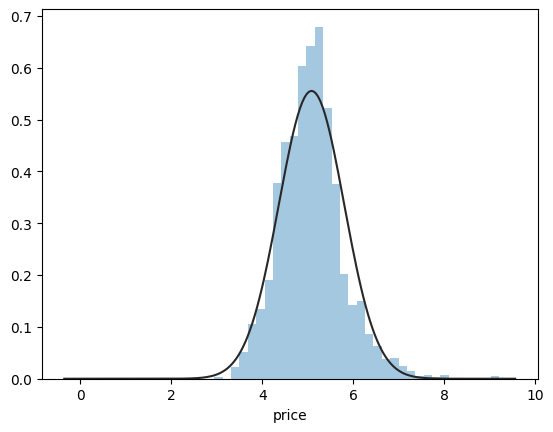

In [9]:
sns.distplot(np.log1p(rentals['price']), kde=False, fit=stats.norm)

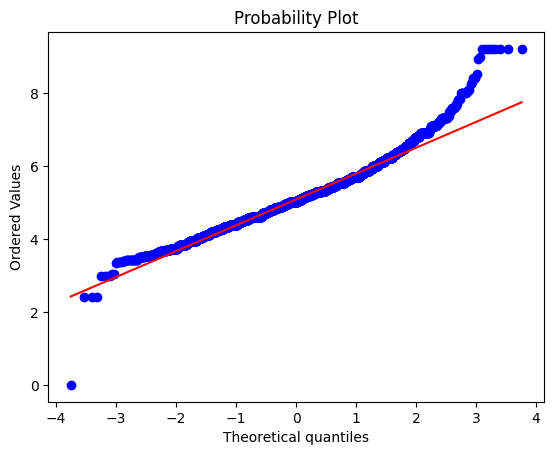

In [10]:
res = stats.probplot(np.log1p(rentals['price']), plot=plt);

### Listing Map

The listings for over ~$1000/night seem high, but might be reasonable depending on the city. Mapping the listings will give a good overview of locale.

In [11]:
def get_location_interactive(df, mapbox_style="open-street-map"):
    """Return a map with markers for houses based on lat and long.
    
    Parameters:
    ===========
    mapbox_style = str; options are following:
        > "white-bg" yields an empty white canvas which results in no external HTTP requests
        > "carto-positron", "carto-darkmatter", "stamen-terrain",
          "stamen-toner" or "stamen-watercolor" yield maps composed of raster tiles 
          from various public tile servers which do not require signups or access tokens
        > "open-street-map" does work 'latitude', 'longitude'
    """
    fig = px.scatter_mapbox(
        df,
        lat=df.latitude,
        lon=df.longitude,
        color='price',
        color_continuous_scale=["green", 'blue', 'red', 'gold'],
        zoom=11.5,
        range_color=[0, df['price'].quantile(0.95)], # to negate outliers
        height=700,
        title='Rental Location',
        opacity=.5,
        center={
            'lat': df.latitude.mode()[0],
            'lon': df.longitude.mode()[0]
        })
    fig.update_layout(mapbox_style=mapbox_style)
    fig.update_layout(margin={"r": 0, "l": 0, "b": 0})
    fig.show()
    pass

# function call
get_location_interactive(rentals)

San Franciso is a large enough city that having very high priced rentals in the upper quartile isn't out of place. However, such listings might skew the average price per bedroom which will be used to fill in missing data. Using the median price instead of the mean price will help mitigate this effect.

### Missing Values

In [12]:
rentals.isna().sum()

latitude           0
longitude          0
property_type      0
room_type          0
bathrooms         12
bedrooms           4
minimum_nights     0
price              0
dtype: int64

There appear to be a few listings that have missing values for the bedrooms and bathrooms. 

In [13]:
rentals[pd.isna(rentals['bedrooms'])]

,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price
269,37.78321,-122.41969,Apartment,Entire home/apt,1.0,NaN,30,124
6301,37.78883,-122.48640,House,Entire home/apt,3.5,NaN,30,650
7786,37.78347,-122.41669,Apartment,Entire home/apt,1.0,NaN,30,75
7840,37.78979,-122.41994,Apartment,Entire home/apt,1.0,NaN,30,108


In [14]:
rentals[pd.isna(rentals['bathrooms'])]

,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price
139,37.79336,-122.42506,Apartment,Private room,NaN,1.0,30,56
181,37.79341,-122.40340,Hostel,Shared room,NaN,1.0,1,45
196,37.79470,-122.40374,Hostel,Shared room,NaN,1.0,1,45
197,37.79441,-122.40473,Hostel,Shared room,NaN,1.0,1,45
267,37.75906,-122.40761,Apartment,Private room,NaN,1.0,31,68
352,37.79384,-122.42436,Apartment,Private room,NaN,1.0,30,63
434,37.79313,-122.40443,Hostel,Shared room,NaN,1.0,1,45
435,37.79421,-122.40310,Hostel,Shared room,NaN,1.0,1,45
436,37.79260,-122.40339,Hostel,Shared room,NaN,1.0,1,45
539,37.74833,-122.42621,Apartment,Entire home/apt,NaN,1.0,30,127


There are 4 listings missing bedrooms and 12 listings missing bathrooms with no overlap. These values will be taken care of after a full investigation of the dataset.

### Bedroom and Bathroom Distributions

The distribution of bedrooms and bathrooms are suspect, as the minimum of each is 0, which would be odd for certain rental properties. The maximum number of 14 bedrooms and bathrooms is also suspect.

<AxesSubplot:xlabel='bedrooms', ylabel='count'>

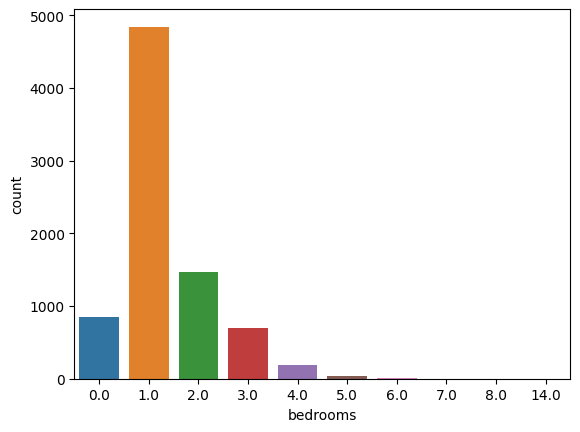

In [15]:
#plot of bedroom count
sns.countplot(x='bedrooms', data=rentals)

<AxesSubplot:xlabel='bathrooms', ylabel='count'>

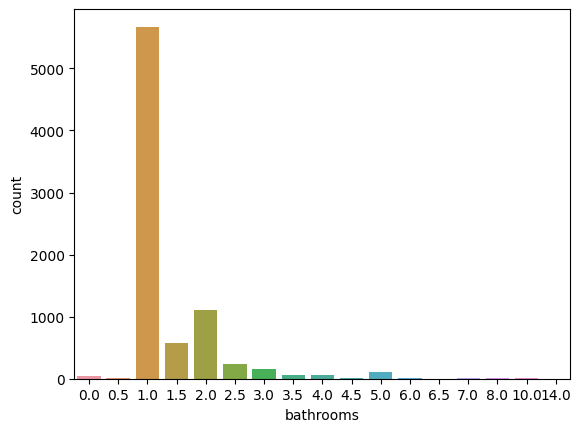

In [16]:
#plot of bathroom count
sns.countplot(x='bathrooms', data=rentals)

In [17]:
rentals[rentals['bedrooms'] == 0]['bedrooms'].count()

854

There are enough 0 bedroom rentals at 10% of the dataset that removing them is not a good idea. 

## 2. Bedroom and Bathroom Value Cleanup

### Bedrooms Listing Investigation and Cleanup

#### Zero Bedroom Listings

##### Single Room Listings

An easy first step is to set the number of bedrooms to '1' for any listings that are for room types that are only one room.

In [18]:
#count number of listings with 0 bedrooms that are private rooms
rentals[rentals['bedrooms'] == 0].groupby('room_type').count()

,latitude,longitude,property_type,bathrooms,bedrooms,minimum_nights,price
room_type,,,,,,,
Entire home/apt,641,641,641,641,641,641,641
Hotel room,34,34,34,34,34,34,34
Private room,179,179,179,179,179,179,179


'Private room' must be a minimum of 1 bedroom, so those listings will be set to 1 bedroom. Hotel rooms could possibly be suites with multiple bedrooms, so they will dealt with later.

In [19]:
#set 0 bedroom private room listings to 1 bedroom
cond_zero_bedrooms_private_room = ((rentals['bedrooms'] == 0) & (rentals['room_type'] == 'Private room'))
rentals.loc[cond_zero_bedrooms_private_room, 'bedrooms'] = 1

In [20]:
#verify success
rentals[rentals['bedrooms'] == 0].groupby('room_type').count()

,latitude,longitude,property_type,bathrooms,bedrooms,minimum_nights,price
room_type,,,,,,,
Entire home/apt,641,641,641,641,641,641,641
Hotel room,34,34,34,34,34,34,34


While we are at it, checking if single room types have more than one bedroom is a good plan.

In [21]:
#check number of bedrooms by room type
rentals.groupby('room_type')['bedrooms'].value_counts().sort_index()

room_type        bedrooms
Entire home/apt  0.0          641
                 1.0         1885
                 2.0         1339
                 3.0          672
                 4.0          184
                 5.0           36
                 6.0            9
                 7.0            1
                 8.0            1
Hotel room       0.0           34
                 1.0          158
                 2.0           12
                 3.0            3
Private room     1.0         2740
                 2.0          121
                 3.0           19
                 4.0            9
                 5.0            1
                 14.0           1
Shared room      1.0          241
Name: bedrooms, dtype: int64

We will drop the 14 bedroom listing as an outlier.

In [22]:
#set all private room listings to 1 bedroom
rentals[rentals['bedrooms'] == 14]

,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price
2386,37.78199,-122.4217,Boutique hotel,Private room,14.0,14.0,7,69


In [23]:
rentals.drop(2386, inplace=True)

In [24]:
#verify
rentals.groupby('room_type')['bedrooms'].value_counts().sort_index()

room_type        bedrooms
Entire home/apt  0.0          641
                 1.0         1885
                 2.0         1339
                 3.0          672
                 4.0          184
                 5.0           36
                 6.0            9
                 7.0            1
                 8.0            1
Hotel room       0.0           34
                 1.0          158
                 2.0           12
                 3.0            3
Private room     1.0         2740
                 2.0          121
                 3.0           19
                 4.0            9
                 5.0            1
Shared room      1.0          241
Name: bedrooms, dtype: int64

In [25]:
#check property type of 0 bedroom whole house
rentals[(rentals['room_type'] == 'Entire home/apt') & (rentals['bedrooms'] == 0)].groupby('property_type').value_counts().sort_index()

property_type       latitude  longitude   room_type        bathrooms  bedrooms  minimum_nights  price
Apartment           37.71389  -122.39809  Entire home/apt  1.0        0.0       2               150      1
                    37.71971  -122.40058  Entire home/apt  1.0        0.0       30              90       1
                    37.72122  -122.45274  Entire home/apt  1.0        0.0       30              100      1
                    37.72944  -122.42899  Entire home/apt  1.0        0.0       3               115      1
                    37.73034  -122.42583  Entire home/apt  1.0        0.0       3               135      1
                                                                                                        ..
Serviced apartment  37.79207  -122.40887  Entire home/apt  1.0        0.0       2               95       1
                    37.79212  -122.40786  Entire home/apt  1.0        0.0       2               95       1
                    37.79678  -122.42511  

##### Median Number of Bedrooms per Price Bracket Imputation

The 0 bedroom listings for whole homes could be studio apartments or townhouses. We will replace the remaining 0 bedroom rooms for hotel rooms with the average number of bedrooms for the listing's price bracket. Due to the skewed nature of the dataset, we will use the median in order for the extreme right tail to not unduly influence the average.

In [26]:
#get range of bedrooms in properties
rentals['bedrooms'].value_counts().sort_index()

0.0     675
1.0    5024
2.0    1472
3.0     694
4.0     193
5.0      37
6.0       9
7.0       1
8.0       1
Name: bedrooms, dtype: int64

In [27]:
#calculate median pice based on number of beds
med_price_per_num_of_beds = {}
for i in range(8):
    med_price_per_num_of_beds[i+1] = rentals[rentals['bedrooms'] == (i+1)]['price'].median().round()
print(med_price_per_num_of_beds)

{1: 125.0, 2: 230.0, 3: 350.0, 4: 450.0, 5: 750.0, 6: 1200.0, 7: 1395.0, 8: 1795.0}


In [28]:
#add 0 to 'med_price_per_num_of_beds' for ease of later calculations
med_price_per_num_of_beds[0] = 0

In [29]:
#create list of 'differences' between median bedroom prices to have appropriate ranges
list_of_diff = []
for i in range(8):
    range_diff = (med_price_per_num_of_beds[i+1] - med_price_per_num_of_beds[i])/2
    list_of_diff.append(range_diff)
print(list_of_diff)

[62.5, 52.5, 60.0, 50.0, 150.0, 225.0, 97.5, 200.0]


In [30]:
#add difference to original values to create range upper bounds
high_range_med_price_per_num_of_beds = {}
for i in range(7):
    high_range_med_price_per_num_of_beds[i+1] = (med_price_per_num_of_beds[i+1] + list_of_diff[i+1])
print(high_range_med_price_per_num_of_beds)

{1: 177.5, 2: 290.0, 3: 400.0, 4: 600.0, 5: 975.0, 6: 1297.5, 7: 1595.0}


In [31]:
high_range_med_price_per_num_of_beds[0] = 0
print(high_range_med_price_per_num_of_beds)

{1: 177.5, 2: 290.0, 3: 400.0, 4: 600.0, 5: 975.0, 6: 1297.5, 7: 1595.0, 0: 0}


In [32]:
#show amount of rentals with 0 bedrooms
rentals[rentals['bedrooms'] == 0]['bedrooms'].value_counts()

0.0    675
Name: bedrooms, dtype: int64

In [33]:
#replace 1-7 bedroom price ranges as appropriate
for i in range(7):
    cond = (
            (rentals['bedrooms'] == 0) & 
            (rentals['room_type'] == 'Hotel room') &
            (rentals['price'] <= high_range_med_price_per_num_of_beds[i+1]) & 
            (rentals['price'] > high_range_med_price_per_num_of_beds[i])
           )
    rentals.loc[cond, 'bedrooms'] = (i+1)
    print(rentals[cond]['bedrooms'].value_counts())

1.0    24
Name: bedrooms, dtype: int64
2.0    10
Name: bedrooms, dtype: int64
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)


In [34]:
#replace bedroom amount above 7 bedroom median range with 8 bedrooms
final_cond = (
              (rentals['bedrooms'] == 0) & 
              (rentals['room_type'] == 'Hotel room') &
              (rentals['price'] > high_range_med_price_per_num_of_beds[7])
             )
rentals.loc[final_cond, 'bedrooms'] = 8
print(rentals[final_cond]['bedrooms'].value_counts())

Series([], Name: bedrooms, dtype: int64)


In [35]:
#verify
rentals.groupby('room_type')['bedrooms'].value_counts().sort_index()

room_type        bedrooms
Entire home/apt  0.0          641
                 1.0         1885
                 2.0         1339
                 3.0          672
                 4.0          184
                 5.0           36
                 6.0            9
                 7.0            1
                 8.0            1
Hotel room       1.0          182
                 2.0           22
                 3.0            3
Private room     1.0         2740
                 2.0          121
                 3.0           19
                 4.0            9
                 5.0            1
Shared room      1.0          241
Name: bedrooms, dtype: int64

In [36]:
print(rentals.info())
print(rentals.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8110
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   latitude        8110 non-null   float64
 1   longitude       8110 non-null   float64
 2   property_type   8110 non-null   object 
 3   room_type       8110 non-null   object 
 4   bathrooms       8098 non-null   float64
 5   bedrooms        8106 non-null   float64
 6   minimum_nights  8110 non-null   int64  
 7   price           8110 non-null   int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 570.2+ KB
None
          latitude    longitude    bathrooms     bedrooms  minimum_nights  \
count  8110.000000  8110.000000  8098.000000  8106.000000    8.110000e+03   
mean     37.766052  -122.430108     1.394418     1.371823    1.234678e+04   
std       0.022938     0.026969     0.912582     0.889817    1.110426e+06   
min      37.704630  -122.513060     0.000000     0.000000    1.0000

### Missing Bedroom Listing Imputation

Missing bedroom listings will be treated the same way as the 0 bedroom listings.

In [37]:
#check number of missing bedroom values
rentals['bedrooms'].isna().value_counts()

False    8106
True        4
Name: bedrooms, dtype: int64

In [38]:
#replace missing bedroom values with average per price bracket
for i in range(7):
    cond = (
            (rentals['bedrooms'].isna()) & 
            (rentals['price'] <= high_range_med_price_per_num_of_beds[i+1]) & 
            (rentals['price'] > high_range_med_price_per_num_of_beds[i])
           )
    rentals.loc[cond, 'bedrooms'] = (i+1)
    print(rentals[cond]['bedrooms'].value_counts())

#replace bedroom amount above 8 bedroom average with 8 bedrooms
final_cond = (
              (rentals['bedrooms'].isna()) & 
              (rentals['price'] > high_range_med_price_per_num_of_beds[7])
             )
rentals.loc[final_cond, 'bedrooms'] = 8
print(rentals[final_cond]['bedrooms'].value_counts())

1.0    3
Name: bedrooms, dtype: int64
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
5.0    1
Name: bedrooms, dtype: int64
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)
Series([], Name: bedrooms, dtype: int64)


In [39]:
#verify no more missing bedroom values
rentals['bedrooms'].isna().value_counts()

False    8110
Name: bedrooms, dtype: int64

In [40]:
print(rentals.info())
print(rentals.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8110
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   latitude        8110 non-null   float64
 1   longitude       8110 non-null   float64
 2   property_type   8110 non-null   object 
 3   room_type       8110 non-null   object 
 4   bathrooms       8098 non-null   float64
 5   bedrooms        8110 non-null   float64
 6   minimum_nights  8110 non-null   int64  
 7   price           8110 non-null   int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 570.2+ KB
None
          latitude    longitude    bathrooms     bedrooms  minimum_nights  \
count  8110.000000  8110.000000  8098.000000  8110.000000    8.110000e+03   
mean     37.766052  -122.430108     1.394418     1.372133    1.234678e+04   
std       0.022938     0.026969     0.912582     0.890538    1.110426e+06   
min      37.704630  -122.513060     0.000000     0.000000    1.0000

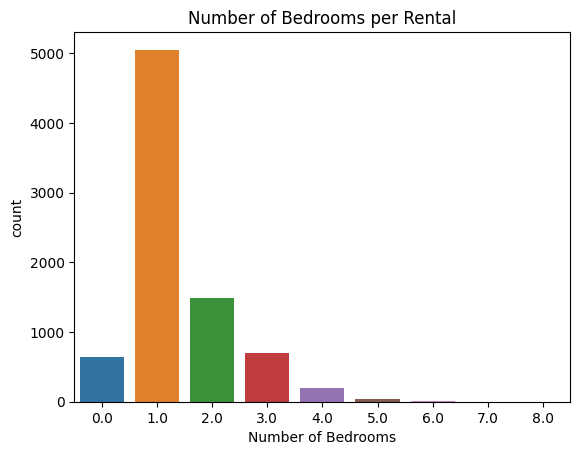

In [41]:
#plot of bedroom count
ax = sns.countplot(x='bedrooms', data=rentals)
ax.set(xlabel='Number of Bedrooms', title='Number of Bedrooms per Rental')

plt.show()

### Bathroom Listing Investigation and Imputation

#### Zero Bathroom Listings

##### Initial Investigation

Some further investigation into the bathroom amounts is warranted, since the number of bathrooms should either be close to the number of bedrooms or less than.

<AxesSubplot:xlabel='bedrooms_jitter', ylabel='bathrooms'>

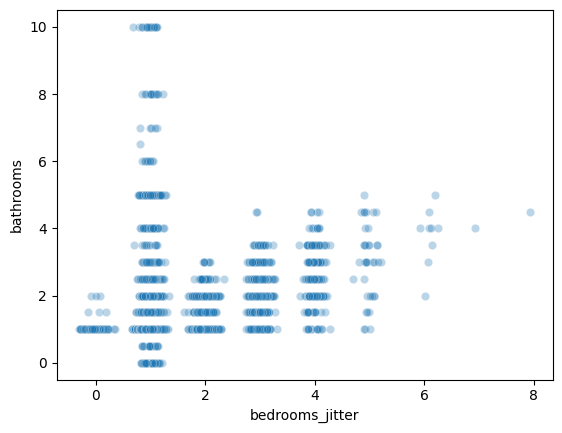

In [42]:
#add jitter to enable better visualization of trends
rentals['bedrooms_jitter'] = rentals['bedrooms'] + np.random.normal(0, .1, size=len(rentals))
sns.scatterplot(data=rentals, x='bedrooms_jitter', y='bathrooms', alpha=0.3)

In [43]:
rentals.groupby(['property_type', 'bedrooms'])['bathrooms'].value_counts().sort_index()

property_type  bedrooms  bathrooms
Aparthotel     1.0       1.0          27
                         4.0           2
                         7.0           5
                         8.0           5
                         10.0          1
                                      ..
Townhouse      5.0       3.0           1
               6.0       4.0           1
Villa          1.0       1.0           5
                         2.0           4
               6.0       5.0           1
Name: bathrooms, Length: 240, dtype: int64

In [44]:
rentals.groupby('room_type')['bathrooms'].value_counts().sort_index()

room_type        bathrooms
Entire home/apt  0.0             1
                 0.5             1
                 1.0          3275
                 1.5           304
                 2.0           856
                 2.5           152
                 3.0            98
                 3.5            52
                 4.0            16
                 4.5            14
                 5.0             2
Hotel room       0.0             3
                 1.0           145
                 1.5             1
                 2.0            14
                 3.0             1
                 3.5             4
                 4.0            11
                 5.0            22
                 6.0             5
                 8.0             1
Private room     0.0            27
                 0.5            16
                 1.0          2196
                 1.5           266
                 2.0           189
                 2.5            43
                 3.0        

##### Home and Hotel Zero Bathroom Listings

Private and shared rooms may have 0 bathrooms directly associated with the room, so I will keep those 0 values. However, it would be highly unusual for an home/apt or a hotel room to have no bathrooms. The number of bathrooms will be set equal to the number of bedrooms.

In [45]:
#set 0 bathroom home/apt and hotel listings to equal the number of bedrooms
cond_zero_bath_home_hotel = (
                             (rentals['bathrooms'] == 0) & 
                             ((rentals['room_type'] == 'Entire home/apt') | (rentals['room_type'] == 'Hotel room'))
                            )
rentals.loc[cond_zero_bath_home_hotel, 'bathrooms'] = rentals.loc[cond_zero_bath_home_hotel, 'bedrooms']

In [46]:
#verify no more 0 bathroom home/apt or hotel listings
rentals.groupby('room_type')['bathrooms'].value_counts().sort_index()

room_type        bathrooms
Entire home/apt  0.5             1
                 1.0          3276
                 1.5           304
                 2.0           856
                 2.5           152
                 3.0            98
                 3.5            52
                 4.0            16
                 4.5            14
                 5.0             2
Hotel room       1.0           148
                 1.5             1
                 2.0            14
                 3.0             1
                 3.5             4
                 4.0            11
                 5.0            22
                 6.0             5
                 8.0             1
Private room     0.0            27
                 0.5            16
                 1.0          2196
                 1.5           266
                 2.0           189
                 2.5            43
                 3.0            23
                 3.5             2
                 4.0        

#### Final Outliers and Oddities

We will update the scatterplot from before and check for any remaining oddities or outliers.

<AxesSubplot:xlabel='bedrooms_jitter', ylabel='bathrooms'>

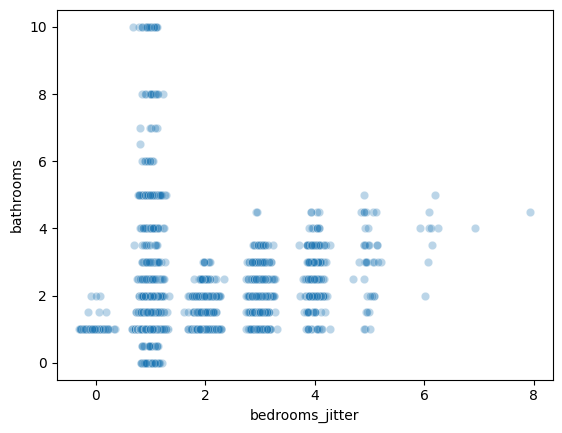

In [47]:
sns.scatterplot(data=rentals, x='bedrooms_jitter', y='bathrooms', alpha=0.3)

It doesn't seem reasonable to have more than approximately +2 bathrooms for any number of bedrooms. All of the high listings of bathrooms are for hostels with listings for 1 bedroom. Unless the listing is for an entire home/apt, the number of bathrooms should be limited to the number of bedrooms in the listing. 

In [48]:
#change hotel room type listings to have matching bathrooms and bedrooms
cond = ((rentals['room_type'] != 'Entire home/apt') & (rentals['bathrooms'] > (rentals['bedrooms'] + 2)))
rentals.loc[cond, 'bathrooms'] = rentals.loc[cond, 'bedrooms']

In [49]:
#verify
rentals[rentals['room_type'] != 'Entire home/apt'].groupby(['room_type', 'bedrooms'])['bathrooms'].value_counts().sort_index()

room_type     bedrooms  bathrooms
Hotel room    1.0       1.0           174
                        1.5             1
                        2.0             6
                        3.0             1
              2.0       1.0            17
                        2.0             5
              3.0       2.0             3
Private room  1.0       0.0            27
                        0.5            16
                        1.0          2235
                        1.5           249
                        2.0           153
                        2.5            34
                        3.0            21
              2.0       1.0            79
                        1.5            12
                        2.0            26
                        2.5             4
              3.0       1.0             6
                        1.5             4
                        2.0             6
                        2.5             2
                        3.0             1


<AxesSubplot:xlabel='bedrooms_jitter', ylabel='bathrooms'>

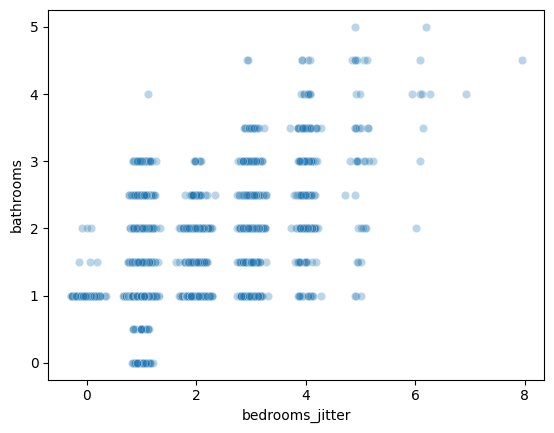

In [50]:
sns.scatterplot(data=rentals, x='bedrooms_jitter', y='bathrooms', alpha=0.3)

In [51]:
#check all rentals have less than +2 bathrooms per bedroom
rentals[rentals['bathrooms'] > (rentals['bedrooms'] + 2)]

,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price,bedrooms_jitter
4154,37.7916,-122.44792,House,Entire home/apt,4.0,1.0,30,500,1.112899


There is 1 more outlier, one with 4 bathrooms for 1 bedroom. Dropping the listing is the best plan.

In [52]:
rentals.drop(4154, inplace=True)

<AxesSubplot:xlabel='bedrooms_jitter', ylabel='bathrooms'>

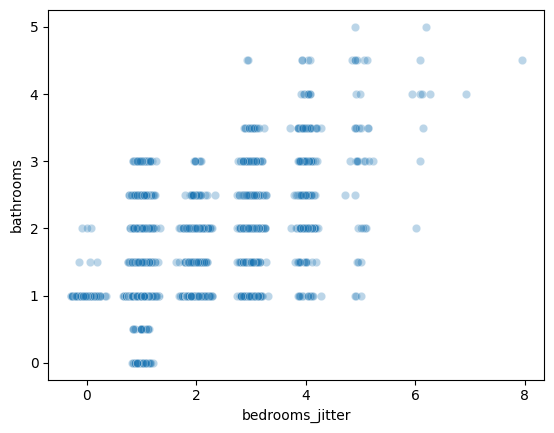

In [53]:
#verify outliers are removed
sns.scatterplot(data=rentals, x='bedrooms_jitter', y='bathrooms', alpha=0.3)

### Missing Bathroom Listings

Now that the bathroom values are cleaned up let's take a look at the missing values.

In [54]:
print(rentals.info())
print(rentals.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8109 entries, 0 to 8110
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   latitude         8109 non-null   float64
 1   longitude        8109 non-null   float64
 2   property_type    8109 non-null   object 
 3   room_type        8109 non-null   object 
 4   bathrooms        8097 non-null   float64
 5   bedrooms         8109 non-null   float64
 6   minimum_nights   8109 non-null   int64  
 7   price            8109 non-null   int64  
 8   bedrooms_jitter  8109 non-null   float64
dtypes: float64(5), int64(2), object(2)
memory usage: 633.5+ KB
None
          latitude    longitude    bathrooms     bedrooms  minimum_nights  \
count  8109.000000  8109.000000  8097.000000  8109.000000    8.109000e+03   
mean     37.766048  -122.430106     1.276522     1.372179    1.234830e+04   
std       0.022937     0.026970     0.551326     0.890583    1.110494e+06   
min      37

There are a few missing values to take care of. Using the median price per number bathrooms, like the bedrooms, to fill in the missing data is reasonable.

In [55]:
#calculate average pice based on number of bathrooms
med_price_per_num_of_baths = {}
for i in range(6):
    med_price_per_num_of_baths[i] = rentals[rentals['bathrooms'] == (i)]['price'].median().round()
print(med_price_per_num_of_baths)

{0: 65.0, 1: 140.0, 2: 253.0, 3: 300.0, 4: 700.0, 5: 1540.0}


In [56]:
#create list of 'differences' between mean bathroom prices to have appropriate ranges
list_of_diff_bath = []
for i in range(5):
    range_diff = (med_price_per_num_of_baths[i+1] - med_price_per_num_of_baths[i])/2
    list_of_diff_bath.append(range_diff)
print(list_of_diff_bath)

[37.5, 56.5, 23.5, 200.0, 420.0]


In [57]:
#create midpoint range dict
high_range_med_price_per_num_of_baths = {}
for i in range(5):
    high_range_med_price_per_num_of_baths[i] = (med_price_per_num_of_baths[i] + list_of_diff_bath[i])
print(high_range_med_price_per_num_of_baths)

{0: 102.5, 1: 196.5, 2: 276.5, 3: 500.0, 4: 1120.0}


In [58]:
#replace bathroom amount with 0 bathrooms with average price
final_cond = (
              (rentals['bathrooms'].isna()) & 
              (rentals['price'] < high_range_med_price_per_num_of_baths[0])
             )
rentals.loc[final_cond, 'bathrooms'] = 0
print(rentals[final_cond]['bathrooms'].value_counts())
#replace missing bathroom values with average price per number of bathrooms
for i in range(4):
    cond = (
            (rentals['bathrooms'].isna()) & 
            (rentals['price'] <= high_range_med_price_per_num_of_baths[i+1]) & 
            (rentals['price'] > high_range_med_price_per_num_of_baths[i])
           )
    rentals.loc[cond, 'bathrooms'] = (i+1)
    print(rentals[cond]['bathrooms'].value_counts())
#replace bathroom amount above 4 bathroom average with 5 bathrooms
final_cond = (
              (rentals['bathrooms'].isna()) & 
              (rentals['price'] > high_range_med_price_per_num_of_baths[4])
             )
rentals.loc[final_cond, 'bathrooms'] = 5
print(rentals[final_cond]['bathrooms'].value_counts())

0.0    11
Name: bathrooms, dtype: int64
1.0    1
Name: bathrooms, dtype: int64
Series([], Name: bathrooms, dtype: int64)
Series([], Name: bathrooms, dtype: int64)
Series([], Name: bathrooms, dtype: int64)
Series([], Name: bathrooms, dtype: int64)


In [59]:
print(rentals.info())
print(rentals.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8109 entries, 0 to 8110
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   latitude         8109 non-null   float64
 1   longitude        8109 non-null   float64
 2   property_type    8109 non-null   object 
 3   room_type        8109 non-null   object 
 4   bathrooms        8109 non-null   float64
 5   bedrooms         8109 non-null   float64
 6   minimum_nights   8109 non-null   int64  
 7   price            8109 non-null   int64  
 8   bedrooms_jitter  8109 non-null   float64
dtypes: float64(5), int64(2), object(2)
memory usage: 633.5+ KB
None
          latitude    longitude    bathrooms     bedrooms  minimum_nights  \
count  8109.000000  8109.000000  8109.000000  8109.000000    8.109000e+03   
mean     37.766048  -122.430106     1.274756     1.372179    1.234830e+04   
std       0.022937     0.026970     0.552927     0.890583    1.110494e+06   
min      37

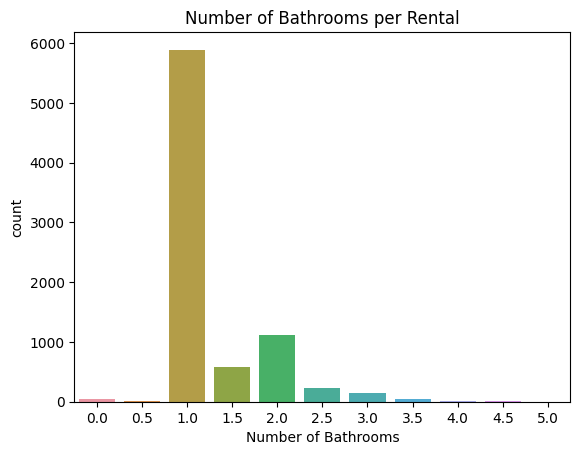

In [60]:
#plot of bathroom count
ax = sns.countplot(x='bathrooms', data=rentals)
ax.set(xlabel='Number of Bathrooms', title='Number of Bathrooms per Rental')

plt.show()

## 3. Final Cleanup

### Minimum Nights Cleanup

Time to check the minimum_nights column.

In [61]:
rentals['minimum_nights'].value_counts().sort_index()

1            1429
2            1553
3             863
4             322
5             216
6              36
7              73
8               2
9               1
10              4
11              1
12              1
13              4
14             10
15              1
16              1
18              2
21              4
25              1
28              1
29              2
30           3269
31            115
32             60
33              1
38              1
40              2
45              2
50              3
55              1
58              2
59              1
60             40
65              1
70              1
75              2
80              3
85              1
90             31
100             1
110             1
120             4
140             1
150             1
180            18
183             3
188             1
200             1
360             3
365             9
1000            1
1125            1
100000000       1
Name: minimum_nights, dtype: int64

Anything over 1 year is suspect. With only 3 listings that meet that criteria, lowering them all to 365 nights minimum is reasonable.

In [62]:
#set rentals minimum nights to 365 max
rentals.loc[rentals['minimum_nights'] > 365, 'minimum_nights'] = 365

In [63]:
rentals['minimum_nights'].value_counts().sort_index()

1      1429
2      1553
3       863
4       322
5       216
6        36
7        73
8         2
9         1
10        4
11        1
12        1
13        4
14       10
15        1
16        1
18        2
21        4
25        1
28        1
29        2
30     3269
31      115
32       60
33        1
38        1
40        2
45        2
50        3
55        1
58        2
59        1
60       40
65        1
70        1
75        2
80        3
85        1
90       31
100       1
110       1
120       4
140       1
150       1
180      18
183       3
188       1
200       1
360       3
365      12
Name: minimum_nights, dtype: int64

In [64]:
print(rentals.describe())

          latitude    longitude    bathrooms     bedrooms  minimum_nights  \
count  8109.000000  8109.000000  8109.000000  8109.000000     8109.000000   
mean     37.766048  -122.430106     1.274756     1.372179       16.198545   
std       0.022937     0.026970     0.552927     0.890583       23.208814   
min      37.704630  -122.513060     0.000000     0.000000        1.000000   
25%      37.751450  -122.442830     1.000000     1.000000        2.000000   
50%      37.769150  -122.424650     1.000000     1.000000        4.000000   
75%      37.785670  -122.410610     1.500000     2.000000       30.000000   
max      37.828790  -122.368570     5.000000     8.000000      365.000000   

              price  bedrooms_jitter  
count   8109.000000      8109.000000  
mean     225.392527         1.371951  
std      412.288944         0.896202  
min        0.000000        -0.293495  
25%      100.000000         0.939669  
50%      150.000000         1.044935  
75%      240.000000         1.935

### Index Reset

The index of the rentals database needs to be reset due to some dropped entries.

In [65]:
rentals.reset_index(inplace=True)
rentals.drop('index', axis=1, inplace=True)

In [66]:
rentals

,latitude,longitude,property_type,room_type,bathrooms,bedrooms,minimum_nights,price,bedrooms_jitter
0,37.76931,-122.43386,Apartment,Entire home/apt,1.0,1.0,1,170,0.948253
1,37.75402,-122.45805,House,Private room,1.0,1.0,1,99,0.890784
2,37.74511,-122.42102,Apartment,Entire home/apt,1.0,2.0,30,235,2.050762
3,37.76669,-122.45250,Apartment,Private room,1.0,1.0,32,65,1.014417
4,37.76487,-122.45183,Apartment,Private room,1.0,1.0,32,65,1.156621
...,...,...,...,...,...,...,...,...,...
8104,37.74010,-122.41196,House,Private room,2.0,3.0,30,699,2.936269
8105,37.77799,-122.42159,Condominium,Entire home/apt,1.0,1.0,1,200,1.041065
8106,37.73410,-122.38917,Hut,Private room,2.0,1.0,30,69,1.074114
8107,37.78144,-122.41207,Apartment,Entire home/apt,1.0,1.0,30,187,1.040011


## DATA VALIDATION SUMMARY

- Set single room types to 1 bedroom 
- Bedrooms at 0 or missing: replaced with the median bedrooms for the price of the listing
- Set bathrooms of certain room types to match bedrooms due to nature of the room
- Drop bathroom vs bedroom outliers
- Bathrooms at 0 or missing: replaced with the mean bathrooms for the price of the listing
- Set minimum night listings to 365 days max

## 4. Exploratory Analysis

### Hexbin Creation and Mapping

#### Initial Hexbin Creation

Moving on the some exploratory analysis, creating a hexbin map will help with visualization of the price distribution, as well as assist with model training.

In [67]:
#create subset of dataset containing price and geo data
rentals_hex = rentals[['latitude', 'longitude', 'price']]

In [68]:
#rename columns for method
rentals_hex = rentals_hex.rename({'longitude': 'lng', 'latitude': 'lat'}, axis=1)[['lng', 'lat', 'price']]
rentals_hex.head()

,lng,lat,price
0,-122.43386,37.76931,170
1,-122.45805,37.75402,99
2,-122.42102,37.74511,235
3,-122.45250,37.76669,65
4,-122.45183,37.76487,65


In [69]:
#create h3 id points
rentals_h3_10 = rentals_hex.h3.geo_to_h3(10)
rentals_h3_10.head()

,lng,lat,price
h3_10,,,
8a2830828b6ffff,-122.43386,37.76931,170
8a283095e7b7fff,-122.45805,37.75402,99
8a283082c8e7fff,-122.42102,37.74511,235
8a283082d277fff,-122.45250,37.76669,65
8a283082d357fff,-122.45183,37.76487,65


In [70]:
#create h3 hex groups
rentals_h3_10 = rentals_h3_10.drop(columns=['lng', 'lat']).groupby('h3_10').mean()
rentals_h3_10.head()

,price
h3_10,
8a283080c827fff,220.0
8a283080c847fff,225.0
8a283080c85ffff,199.0
8a283080c867fff,280.0
8a283080c86ffff,300.0


In [71]:
#create h3 hex polygons
grentals_h3_10 = rentals_h3_10.h3.h3_to_geo_boundary()
grentals_h3_10.head()

,price,geometry
h3_10,,
8a283080c827fff,220.0,"POLYGON ((-122.39902 37.79877, -122.39838 37.7..."
8a283080c847fff,225.0,"POLYGON ((-122.40218 37.80127, -122.40154 37.8..."
8a283080c85ffff,199.0,"POLYGON ((-122.40175 37.80245, -122.40111 37.8..."
8a283080c867fff,280.0,"POLYGON ((-122.40261 37.80009, -122.40197 37.8..."
8a283080c86ffff,300.0,"POLYGON ((-122.40366 37.80093, -122.40302 37.8..."


#### Hexbin Mapping

In [72]:
def hex_map_plot(df, mapbox_style="open-street-map", color_quantile=0.95):
    """Return a hex map with markers for rental listings based on price.
    
    Parameters:
    ===========
    mapbox_style = str; options are following:
        > "white-bg" yields an empty white canvas which results in no external HTTP requests
        > "carto-positron", "carto-darkmatter", "stamen-terrain",
          "stamen-toner" or "stamen-watercolor" yield maps composed of raster tiles 
          from various public tile servers which do not require signups or access tokens
        > "open-street-map" does work 'latitude', 'longitude'
    """
    fig = px.choropleth_mapbox(
        df,
        geojson=df.geometry,
        locations=df.index,
        color="price",
        center={"lat": 37.7595, "lon": -122.4445},
        mapbox_style="open-street-map",
        zoom=12,
        width=1400,
        height=1200,
        range_color=[0, df['price'].quantile(color_quantile)] # to negate super high value properties
    )
    fig.show()
    pass

In [73]:
#map hex bins
hex_map_plot(grentals_h3_10, color_quantile=1)

Using the full range of the prices does not give us much visual information. Cutting off the upper 3% should help with the color range and visualization.

In [74]:
#map hex bins with scaled color
hex_map_plot(grentals_h3_10, color_quantile=0.97)

Smoothing out the hexs can help visualize trends.

In [75]:
grentals_h3_10s = grentals_h3_10.h3.k_ring_smoothing(2)

In [76]:
hex_map_plot(grentals_h3_10s, color_quantile=0.99)

While the smaller h10 size hexs are nice for intial visualization and granularity, there are too few listings per hex to assist with later model training. We will use the h9 size hexs for a nice balance between granularity and amount of listings per hex.

In [77]:
rentals_h3_09 = rentals_hex.h3.geo_to_h3(9)
rentals_h3_09.head()

,lng,lat,price
h3_09,,,
892830828b7ffff,-122.43386,37.76931,170
89283095e7bffff,-122.45805,37.75402,99
89283082c8fffff,-122.42102,37.74511,235
89283082d27ffff,-122.45250,37.76669,65
89283082d37ffff,-122.45183,37.76487,65


In [78]:
rentals_h3_09 = rentals_h3_09.drop(columns=['lng', 'lat']).groupby('h3_09').mean()
rentals_h3_09.head()

,price
h3_09,
89283080c87ffff,203.5000
89283080c93ffff,194.3500
89283080c97ffff,172.6875
89283080ca3ffff,302.5000
89283080ca7ffff,130.0000


In [79]:
rentals_h3_09 = rentals_h3_09.h3.h3_to_geo_boundary()
rentals_h3_09.head()

,price,geometry
h3_09,,
89283080c87ffff,203.5000,"POLYGON ((-122.40112 37.80044, -122.40005 37.8..."
89283080c93ffff,194.3500,"POLYGON ((-122.39735 37.79592, -122.39627 37.7..."
89283080c97ffff,172.6875,"POLYGON ((-122.40094 37.79725, -122.39987 37.7..."
89283080ca3ffff,302.5000,"POLYGON ((-122.40490 37.80495, -122.40383 37.8..."
89283080ca7ffff,130.0000,"POLYGON ((-122.40850 37.80627, -122.40742 37.8..."


In [80]:
hex_map_plot(rentals_h3_09, color_quantile=0.95)

### Geo Merge into Main Dataframe

We will merge the geo data back into the main rentals dataframe for later modelling work. We will use the h9 level of hex bins to keep the dimensionality of the dataset under control.

In [81]:
rentals_h3_raw = rentals_hex.h3.geo_to_h3(9)
rentals_h3_raw.head()

,lng,lat,price
h3_09,,,
892830828b7ffff,-122.43386,37.76931,170
89283095e7bffff,-122.45805,37.75402,99
89283082c8fffff,-122.42102,37.74511,235
89283082d27ffff,-122.45250,37.76669,65
89283082d37ffff,-122.45183,37.76487,65


In [82]:
#verify
rentals_h3_raw.index.unique()

Index(['892830828b7ffff', '89283095e7bffff', '89283082c8fffff',
       '89283082d27ffff', '89283082d37ffff', '892830829d3ffff',
       '89283082c2bffff', '89283082ea7ffff', '89283082c63ffff',
       '89283082bc7ffff',
       ...
       '89283095023ffff', '8928309550fffff', '8928309555bffff',
       '89283095a33ffff', '89283095637ffff', '89283094257ffff',
       '89283095103ffff', '89283095c17ffff', '89283082e33ffff',
       '8928308250fffff'],
      dtype='object', name='h3_09', length=819)

In [83]:
#move hex label from index to column
rentals_h3_raw.reset_index(inplace=True)

In [84]:
rentals_h3_raw

,h3_09,lng,lat,price
0,892830828b7ffff,-122.43386,37.76931,170
1,89283095e7bffff,-122.45805,37.75402,99
2,89283082c8fffff,-122.42102,37.74511,235
3,89283082d27ffff,-122.45250,37.76669,65
4,89283082d37ffff,-122.45183,37.76487,65
...,...,...,...,...
8104,8928309526fffff,-122.41196,37.74010,699
8105,8928308283bffff,-122.42159,37.77799,200
8106,892830821d7ffff,-122.38917,37.73410,69
8107,8928308287bffff,-122.41207,37.78144,187


In [85]:
rentals_h3_raw.index

RangeIndex(start=0, stop=8109, step=1)

In [86]:
#join h3_09 column to original rentals dataframe
rentals = rentals.join(rentals_h3_raw['h3_09'])

In [87]:
rentals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8109 entries, 0 to 8108
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   latitude         8109 non-null   float64
 1   longitude        8109 non-null   float64
 2   property_type    8109 non-null   object 
 3   room_type        8109 non-null   object 
 4   bathrooms        8109 non-null   float64
 5   bedrooms         8109 non-null   float64
 6   minimum_nights   8109 non-null   int64  
 7   price            8109 non-null   int64  
 8   bedrooms_jitter  8109 non-null   float64
 9   h3_09            8109 non-null   object 
dtypes: float64(5), int64(2), object(3)
memory usage: 633.6+ KB


## 5. Final Dataset Preparation for Modelling

### Categorical Column Datatype

Changing the categorical column datatypes to 'category' will be helpful for later model training.

In [88]:
rentals['property_type'] = rentals['property_type'].astype('category')
rentals['room_type'] = rentals['room_type'].astype('category')
rentals['h3_09'] = rentals['h3_09'].astype('category')

In [89]:
rentals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8109 entries, 0 to 8108
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   latitude         8109 non-null   float64 
 1   longitude        8109 non-null   float64 
 2   property_type    8109 non-null   category
 3   room_type        8109 non-null   category
 4   bathrooms        8109 non-null   float64 
 5   bedrooms         8109 non-null   float64 
 6   minimum_nights   8109 non-null   int64   
 7   price            8109 non-null   int64   
 8   bedrooms_jitter  8109 non-null   float64 
 9   h3_09            8109 non-null   category
dtypes: category(3), float64(5), int64(2)
memory usage: 515.4 KB


### Data Transformation

We will check if any of the data would benefit from transformation before proceeding.

In [90]:
rentals.describe()

,latitude,longitude,bathrooms,bedrooms,minimum_nights,price,bedrooms_jitter
count,8109.000000,8109.000000,8109.000000,8109.000000,8109.000000,8109.000000,8109.000000
mean,37.766048,-122.430106,1.274756,1.372179,16.198545,225.392527,1.371951
std,0.022937,0.026970,0.552927,0.890583,23.208814,412.288944,0.896202
min,37.704630,-122.513060,0.000000,0.000000,1.000000,0.000000,-0.293495
25%,37.751450,-122.442830,1.000000,1.000000,2.000000,100.000000,0.939669
50%,37.769150,-122.424650,1.000000,1.000000,4.000000,150.000000,1.044935
75%,37.785670,-122.410610,1.500000,2.000000,30.000000,240.000000,1.935792
max,37.828790,-122.368570,5.000000,8.000000,365.000000,10000.000000,7.941572


The minimum night and price columns might benefit from a transformation due to their skewed nature. Let's check using some histograms.

<AxesSubplot:xlabel='price'>

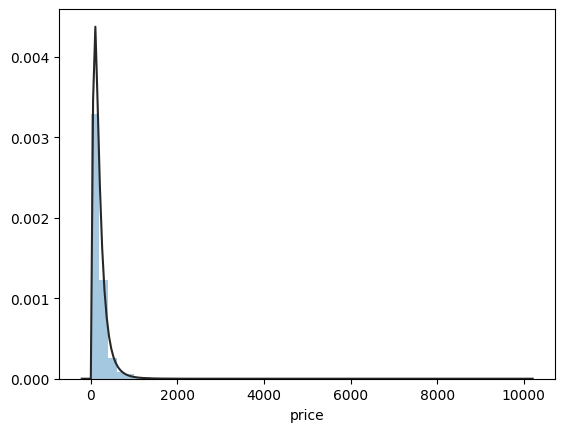

In [91]:
sns.distplot(rentals['price'], kde=False, fit=stats.lognorm)

<AxesSubplot:xlabel='minimum_nights'>

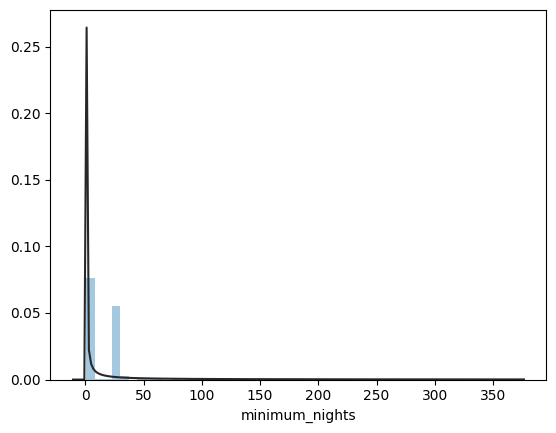

In [92]:
sns.distplot(rentals['minimum_nights'], kde=False, fit=stats.lognorm)

<AxesSubplot:xlabel='price_transformed'>

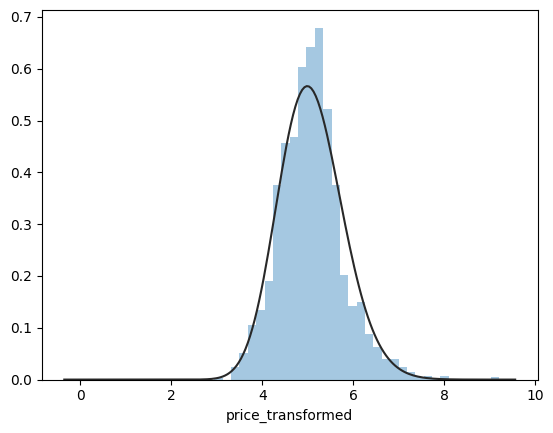

In [93]:
#log transform price column
rentals['price_transformed'] = np.log1p(rentals['price'])
sns.distplot(rentals['price_transformed'], kde=False, fit=stats.lognorm)

<AxesSubplot:xlabel='minimum_nights_transformed'>

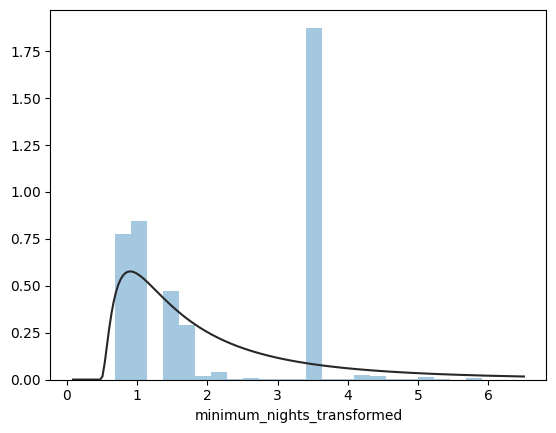

In [94]:
#log transform minimum nights column
rentals['minimum_nights_transformed'] = np.log1p(rentals['minimum_nights'])
sns.distplot(rentals['minimum_nights_transformed'], kde=False, fit=stats.lognorm)

It looks like transforming the price column will be helpful, but not the minimum nights column. We will keep only the price transformation.

### Predictor and Respond Variable

Now we will split the data into a variable to hold the transformed pricing information and another to hold all of the relevant predictor variables. 

In [95]:
list_price = rentals['price_transformed']

In [96]:
predictor_cols = ['property_type', 'room_type', 'latitude', 'longitude',
                  'bathrooms', 'bedrooms', 'minimum_nights', 'h3_09']

list_features = rentals[predictor_cols]
list_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8109 entries, 0 to 8108
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   property_type   8109 non-null   category
 1   room_type       8109 non-null   category
 2   latitude        8109 non-null   float64 
 3   longitude       8109 non-null   float64 
 4   bathrooms       8109 non-null   float64 
 5   bedrooms        8109 non-null   float64 
 6   minimum_nights  8109 non-null   int64   
 7   h3_09           8109 non-null   category
dtypes: category(3), float64(4), int64(1)
memory usage: 388.7 KB


## 6. Model Selection, Training, and Results

The goal of model creation is to create a model that has less than 25 dollars max error. We will use mainly max error and median absolute error to judge the models, as the max_error may be very large due to the skewed nature of listing prices. The median error will allow us to evaluate if we are getting close to hitting our model creation goal and may suggest additional steps.

### KNeighbors Regression

#### Initial Setup

The first model we will train will be a KNeighbors model, since the dataset is likely non-linear, especially with the geographic data. KNeighbors is also relatively quick with training. We will one hot encode the categorical variables and scale the features before splitting into a test and train set and training a model. A pipeline to had the encoding, scaling, and model will be helpful in applying the same steps across the 3 different combinations of data.

In [97]:
#create numeric and categorical feature arrays
numeric_features = list_features.select_dtypes('number').columns
categorical_features = list_features.select_dtypes('category').columns

In [98]:
#make numeric and categorical transformers
numeric_transformer = make_pipeline(StandardScaler())

categorical_transformer = make_pipeline(OneHotEncoder(handle_unknown= 'ignore', sparse=False))

In [99]:
#make a column transformer
col_transformer = make_column_transformer(
    (numeric_transformer, numeric_features), 
    (categorical_transformer, categorical_features),
    remainder='passthrough'
)

#create pipeline with transformer and model
knn_pipe = make_pipeline(col_transformer, KNeighborsRegressor())
knn_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline-1',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'bathrooms', 'bedrooms', 'minimum_nights'], dtype='object')),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['property_type', 'room_type', 'h3_09'], dtype='object'))])),
                ('kneighborsregressor', KNeighborsRegressor())])

#### Initial Training and Results

In [100]:
#Dataframe to store results
results_df = pd.DataFrame(columns=['model', 'max_error', 'median_absolute_error'])

In [101]:
#split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(list_features, list_price, random_state=0)

In [102]:
knn_model = knn_pipe.fit(X_train, y_train)

In [103]:
knn_y_pred = knn_model.predict(X_test)

In [104]:
#Test score of the model
ic(knn_model.score(X_train, y_train))
ic(knn_model.score(X_test, y_test))

ic| knn_model.score(X_train, y_train): 0.7443599674260908
ic| knn_model.score(X_test, y_test): 0.6007139566913813


0.6007139566913813

In [105]:
#calculate RMSE in original units
knn_rmse_org = np.sqrt(mse(np.expm1(y_test), np.expm1(knn_y_pred)))
print("RMSE in $:", np.mean(knn_rmse_org))

RMSE in $: 315.19837183242686


In [106]:
#maximum error value in original units
knn_max_error = max_error(np.expm1(y_test), np.expm1(knn_y_pred))
ic(knn_max_error)

ic| knn_max_error: 7920.882998981831


7920.882998981831

In [107]:
#median absolute error in original units
knn_med_absol_error = median_absolute_error(np.expm1(y_test), np.expm1(knn_y_pred))
ic(knn_med_absol_error)

ic| knn_med_absol_error: 33.420678986095396


33.420678986095396

In [108]:
#add results to results dataframe
results_df = results_df.append({'model': 'knn_model', 'max_error': knn_max_error, 'median_absolute_error': knn_med_absol_error}, ignore_index=True)

In [109]:
#cross validation
knn_cv_score = cross_validate(knn_pipe, list_features, list_price, cv=10, return_train_score=True)

In [110]:
#Convert scores to dataframe
knn_cv_score = pd.DataFrame(knn_cv_score)

#Take the mean of the scores
knn_cv_score.mean()

fit_time       0.076503
score_time     0.131091
test_score     0.526834
train_score    0.747591
dtype: float64

Even with a higher performing split of the data (based on the CV) the values for the RMSE and the max error are really high! Both of those values are larger than the value of most listings. This is likely due to the skewed nature of the listing prices. The median absolute error shows a more reasonable value, but is it still too high to hit our business target. We will try optimizing some of the hyperparameters of the KNN model to try and bring down the error.

#### Hyperparameter Optimization

In [111]:
knn_param_grid = dict(kneighborsregressor__n_neighbors=list(range(1, 31)))

In [112]:
knn_grid = GridSearchCV(knn_pipe, knn_param_grid, cv=10, return_train_score=True)

In [113]:
knn_grid.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('pipeline-1',
                                                                         Pipeline(steps=[('standardscaler',
                                                                                          StandardScaler())]),
                                                                         Index(['latitude', 'longitude', 'bathrooms', 'bedrooms', 'minimum_nights'], dtype='object')),
                                                                        ('pipeline-2',
                                                                         Pipeline(steps=[('onehotencoder',
                                                                                          OneHotEncoder(handle_unknown='ignore',
                                                                                                        sparse=False))]),
                                                                         Index(['property_type', 'room_type', 'h3_09'], dtype='object'))])),
                                       ('kneighborsregressor',
                                        KNeighborsRegressor())]),
             param_grid={'kneighborsregressor__n_neighbors': [1, 2, 3, 4, 5, 6,
                                                              7, 8, 9, 10, 11,
                                                              12, 13, 14, 15,
                                                              16, 17, 18, 19,
                                                              20, 21, 22, 23,
                                                              24, 25, 26, 27,
                                                              28, 29, 30]},
             return_train_score=True)

In [114]:
knn_grid.best_estimator_

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline-1',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'bathrooms', 'bedrooms', 'minimum_nights'], dtype='object')),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['property_type', 'room_type', 'h3_09'], dtype='object'))])),
                ('kneighborsregressor', KNeighborsRegressor(n_neighbors=12))])

In [115]:
#Test score of the model
ic(knn_grid.score(X_train, y_train))
ic(knn_grid.score(X_test, y_test))

ic| knn_grid.score(X_train, y_train): 0.6816876250033194
ic| knn_grid.score(X_test, y_test): 0.614356402136656


0.614356402136656

In [116]:
knn_grid_y_pred = knn_grid.predict(X_test)

In [117]:
#maximum error value in original units
knn_grid_max_error = max_error(np.expm1(y_test), np.expm1(knn_grid_y_pred))
ic(knn_grid_max_error)

ic| knn_grid_max_error: 8450.61524353408


8450.61524353408

In [118]:
#median absolute error in original units
knn_grid_med_absol_error = median_absolute_error(np.expm1(y_test), np.expm1(knn_grid_y_pred))
ic(knn_grid_med_absol_error)

ic| knn_grid_med_absol_error: 31.986833703822953


31.986833703822953

In [119]:
#add results to results dataframe
results_df = results_df.append({'model': 'knn_grid', 'max_error': knn_grid_max_error, 'median_absolute_error': knn_grid_med_absol_error}, ignore_index=True)

There is a modest improvement on the performance with the optimization of the parameters. Overall, the KNeighbors model performs reasonably well on the data, but does not manage to satisfy the business requirement. 

### LightGBM

#### Initial Training and Results

Another type of model that works well with geographic data is boosted gradient trees. This type of ensemble model tends to do well out of the box and even better with a bit of hyperparameter tuning. We will use the lightGBM package due to its ability to handle categorical data easily as well as its lightweight training requirements.

In [120]:
lgb_model = LGBMRegressor()

In [121]:
lgb_model.fit(X_train, y_train)

LGBMRegressor()

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

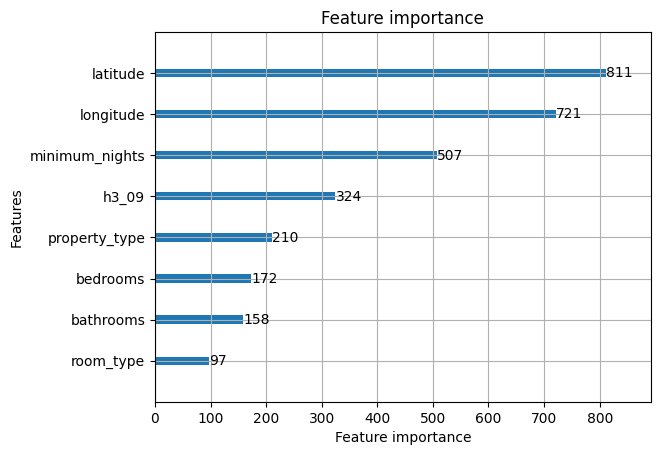

In [122]:
lgb.plot_importance(lgb_model)

In [123]:
#Test score of the model
ic(lgb_model.score(X_train, y_train))
ic(lgb_model.score(X_test, y_test))

ic| lgb_model.score(X_train, y_train): 0.7919584889312987
ic| lgb_model.score(X_test, y_test): 0.6452163119324008


0.6452163119324008

In [124]:
lgb_y_pred = lgb_model.predict(X_test)

In [125]:
#calculate RMSE in original units
lgb_rmse_org = np.sqrt(mse(np.expm1(y_test), np.expm1(lgb_y_pred)))
print("RMSE in $:", np.mean(lgb_rmse_org))

RMSE in $: 346.7631732283889


In [126]:
#maximum error value
lgb_max_error = max_error(np.expm1(y_test), np.expm1(lgb_y_pred))
ic(lgb_max_error)

ic| lgb_max_error: 8633.773514948822


8633.773514948822

In [127]:
#median absolute error
lgb_med_absol_error = median_absolute_error(np.expm1(y_test), np.expm1(lgb_y_pred))
ic(lgb_med_absol_error)

ic| lgb_med_absol_error: 30.249168394850358


30.249168394850358

In [128]:
#add results to results dataframe
results_df = results_df.append({'model': 'lgb_model', 'max_error': lgb_max_error, 'median_absolute_error': lgb_med_absol_error}, ignore_index=True)

The initial values are already better than the KNN model, though still out of the range of the business target. The next step is to optimize the hyperparameters to draw out the most from the model. Gradient trees have a lot of hyperparameters that can take a long time to perform tuning on using GridSearch like we did for the KNN models. To alliviate the tuning computation requirements, Hgboost is a package that allows for advanced hyperparameter searching and optimization for boosted gradient trees, including lightGBM, using Bayesian Search. We will use it to optimize the hyperparameters for our model.

#### Hyperparameter Optimization using Hgboost

In [129]:
# Initialize hgboost library.
hgb = hgboost(
    max_eval=300,      # Search space is based on the number of evaluations.
    threshold=0.5,     # Classification threshold. In case of two-class model this is 0.5.
    cv=10,              # k-folds cross-validation.
    test_size=0.2,     # Percentage split for the testset.
    val_size=0.2,      # Percentage split for the validationset.
    top_cv_evals=10,   # Number of top best performing models that is evaluated.
    is_unbalance=True, # Control the balance of positive and negative weights, useful for unbalanced classes.
    random_state=0, # Fix the random state to create reproducible results.
    n_jobs=-1,         # The number of CPU jobs to run in parallel. -1 means using all processors.
    gpu=False,         # Compute using GPU in case of True.
    verbose=3,         # Print progress to screen.
)

In [130]:
# hgboost preprocessing
X = list_features
y = list_price.values

In [131]:
#run lightGBM regressor optimization
lgb_model_optimized_hgboost = hgb.lightboost_reg(list_features, y)

[hgboost] >Start hgboost regression.
[hgboost] >Collecting lgb_reg parameters.
[hgboost] >method: lgb_reg
[hgboost] >eval_metric: rmse
[hgboost] >greater_is_better: False
[hgboost] >*********************************************************************************
[hgboost] >Total dataset: (8109, 8) 
[hgboost] >Validation set: (1622, 8) 
[hgboost] >Test-set: (1622, 8) 
[hgboost] >Train-set: (4865, 8) 
[hgboost] >*********************************************************************************
[hgboost] >Searching across hyperparameter space for best performing parameters using maximum nr. evaluations: 300
100%|██████████| 300/300 [11:33<00:00,  2.31s/trial, best loss: 0.41092012027707314]
[hgboost]> Collecting the hyperparameters from the [300] trials.
[hgboost] >[rmse]: 0.4109 Best performing model across 300 iterations using Bayesian Optimization with Hyperopt.
[hgboost] >*********************************************************************************
[hgboost] >10-fold cross validat

In [132]:
param = lgb_model_optimized_hgboost['params']

In [133]:
lgb_model_optimized = LGBMRegressor(learning_rate = param['learning_rate'], max_depth = param['max_depth'], min_child_weight = param['min_child_weight'], n_estimators = param['n_estimators'], subsample = param['subsample'])

In [134]:
lgb_model_optimized.fit(X_train, y_train)

LGBMRegressor(learning_rate=0.05, max_depth=14, min_child_weight=4,
              n_estimators=200, subsample=0.8782946753325334)

In [135]:
#Test score of the model
ic(lgb_model_optimized.score(X_train, y_train))
ic(lgb_model_optimized.score(X_test, y_test))

ic| lgb_model_optimized.score(X_train, y_train): 0.7914599314053135
ic| lgb_model_optimized.score(X_test, y_test): 0.6427325726894206


0.6427325726894206

In [136]:
lgb_opt_y_pred = lgb_model_optimized.predict(X_test)

In [137]:
#maximum error value in original units
lgb_opt_max_error = max_error(np.expm1(y_test), np.expm1(lgb_opt_y_pred))
ic(lgb_opt_max_error)

ic| lgb_opt_max_error: 8653.60577969625


8653.60577969625

In [138]:
#median absolute error in original units
lgb_opt_med_absol_error = median_absolute_error(np.expm1(y_test), np.expm1(lgb_opt_y_pred))
ic(lgb_opt_med_absol_error)

ic| lgb_opt_med_absol_error: 30.420092732649856


30.420092732649856

In [139]:
#add results to results dataframe
results_df = results_df.append({'model': 'lgb_model_optimized', 'max_error': lgb_opt_max_error, 'median_absolute_error': lgb_opt_med_absol_error}, ignore_index=True)

## 7. SUMMARY

In [140]:
results_df

,model,max_error,median_absolute_error
0,knn_model,7920.882999,33.420679
1,knn_grid,8450.615244,31.986834
2,lgb_model,8633.773515,30.249168
3,lgb_model_optimized,8653.605780,30.420093


Unfortunately, in the end we were not able to train a model that accomplished the business objective of less than 25 dollars maximum error. The presence of sparse, high value housing in the upper 25th percentile skews the mean absolute error and max error much higher. The median error gives a better idea of the performance of the models on the majority of the listings, but even that metric showed that we were not able to hit the target.

For the future the business should see about including additional data about the various listings, including size, distance to various points of interest, and reviews. This could help improve the model to the desired target range. Another option is having tighter price predict bands on the low value rentals, while accepting more error in the higher value listings. This would help mitigate the effect high value "unique" listings have on the model as a whole. Also given the learnings about data validation in this project, having some data checks on listing data entry, like not allowing 0 bedroom listings, would help keep the data neat and useable.

Separately from the modelling side of things, the business could also focus on other benefits of listing rentals on their site beyond the monetary. Designing the flow of the site and having email follow up (or other follow-up) could help drive more sign-ups.